In [1]:
import os
import glob
import matplotlib

import scipy.io
import numpy as np
import pandas as pd

from matplotlib import cm
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap

import umap
import phate
from sklearn.manifold import MDS
from sklearn.manifold import TSNE

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torch.multiprocessing
torch.multiprocessing.set_sharing_strategy('file_system')

from sklearn.cluster import OPTICS
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering

from sklearn.decomposition import PCA

from sklearn.datasets import make_blobs
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import StandardScaler

#### Ground Truth

In [2]:
adh_vals = [0.00, 0.01, 0.05, 0.09, 0.13, 0.17, 0.21, 0.25]

In [3]:
M1=[[0,0,1,1,1,1,1,1],[0,0,1,1,1,1,1,1],[2,2,3,3,3,3,3,3],[2,2,3,3,3,3,3,3],[2,2,3,3,3,3,3,3],
    [2,2,3,3,3,3,3,3],[2,2,3,3,3,3,3,3],[2,2,3,3,3,3,3,3]]
M2=[[0,0,1,1,1,1,1,1],[0,0,1,1,1,1,1,1],[2,2,3,3,3,3,3,3],[2,2,3,3,3,3,3,3],[2,2,3,3,3,3,3,4],
    [2,2,3,3,3,3,3,3],[2,2,3,3,3,3,4,4],[2,2,3,3,3,3,3,3]]
M3=[[6,6,7,7,7,7,7,7],[6,6,6,7,7,7,7,7],[9,6,3,3,3,3,3,3],[9,10,3,4,4,3,3,4],[9,10,3,3,4,4,3,4],
    [9,10,3,4,4,4,4,4],[9,10,3,4,3,4,4,4],[9,10,3,4,3,4,4,4]]
M4=[[6,6,12,12,7,7,7,7],[6,6,12,12,7,7,7,7],[9,6,6,11,7,7,4,4],[9,9,6,3,3,4,4,4],[9,9,10,3,3,4,4,4],
    [9,9,10,3,3,4,4,4],[9,9,10,4,4,4,4,4],[9,9,10,4,4,4,4,4]]
M5=[[6,6,12,12,12,12,7,7],[6,6,12,12,12,12,12,7],[9,9,6,11,11,11,12,11],[9,9,6,11,11,11,4,4],
    [9,9,13,13,4,4,4,4],[9,9,13,10,4,4,4,4],[9,9,13,10,4,4,4,4],[9,9,10,10,4,4,4,4]]
M6=[[6,12,12,12,12,12,12,12],[6,6,12,12,12,12,12,12],[9,6,6,11,11,11,11,11],[9,9,6,11,11,11,11,11],
    [9,9,6,6,6,13,4,4],[9,9,6,13,13,4,4,4],[9,9,6,13,4,4,4,4],[9,9,6,13,4,4,4,4]]
M7=[[6,6,12,12,12,12,12,12],[9,6,12,12,12,12,12,12],[9,6,6,11,11,11,11,12],[9,6,6,11,11,11,11,11],
    [9,9,6,6,11,11,11,11],[9,9,6,6,11,11,11,4],[9,9,6,6,13,13,4,4],[9,9,6,13,13,4,4,4]]
M8=[[6,12,12,12,12,12,12,12],[6,6,12,12,12,12,12,12],[9,6,6,6,11,11,11,11],[9,6,6,6,11,11,11,11],
    [9,9,6,6,11,11,11,11],[9,9,6,6,6,11,11,11],[9,9,6,6,13,13,11,11],[9,9,6,6,13,13,11,4]]

TrueM = np.asarray([M1,M2,M3,M4,M5,M6,M7,M8])

colors = {"#b6b4b4":0, "#f9ae96":1, "#d5b987":2, "#d0e7c2":3,"#f5f0c2":4, "mediumseagreen":5, "#c3e3f2":6, "#f1f0f8":7, "lightcoral":8, 
          "#d5deec":9, "#e1a59d":10, "#f7b4d1":11,"#ae86af":12, "#b4e0dd":13}

num2col = {v: k for k, v in colors.items()}

num2sim = {0:"o",1:"o",2:"o",3:"o",4:"o",5:"^",6:"s",7:"o",8:"^",9:"^",10:"o",11:"o",12:"o",13:"o"}

l_colors = sorted(colors, key=colors.get)

cMap = ListedColormap(l_colors)

#### Slice Visualization

In [4]:
num_rows = 2
num_cols = 4
num_figs = num_rows*num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols*7,num_rows*6.5), dpi=400)

idx = np.arange(num_figs)
idx = idx.reshape([num_rows,num_cols])

for row_idx in range(2):
    
    for col_idx in range(4):
    
        lin_idx = idx[row_idx, col_idx]
        axes[row_idx, col_idx].pcolor(TrueM[lin_idx], cmap=cMap, vmin=0, vmax=len(colors)-1)
        axes[row_idx, col_idx].set_xlabel("$\gamma_{BB}$", fontsize=25)
        axes[row_idx, col_idx].set_ylabel("$\gamma_{OO}$", fontsize=25)
        axes[row_idx, col_idx].set_title("$\gamma_{OB}$ = " + repr(adh_vals[lin_idx]), fontsize=25, pad=10)
        axes[row_idx, col_idx].set_xticks(np.linspace(0.5, 7.5, 8))
        axes[row_idx, col_idx].set_xticklabels(adh_vals, fontsize=18)
        axes[row_idx, col_idx].set_yticks(np.linspace(0.5, 7.5, 8))
        axes[row_idx, col_idx].set_yticklabels(adh_vals, fontsize=18)

fig.tight_layout()
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)
plt.show()

#### 3D Cube Visualization

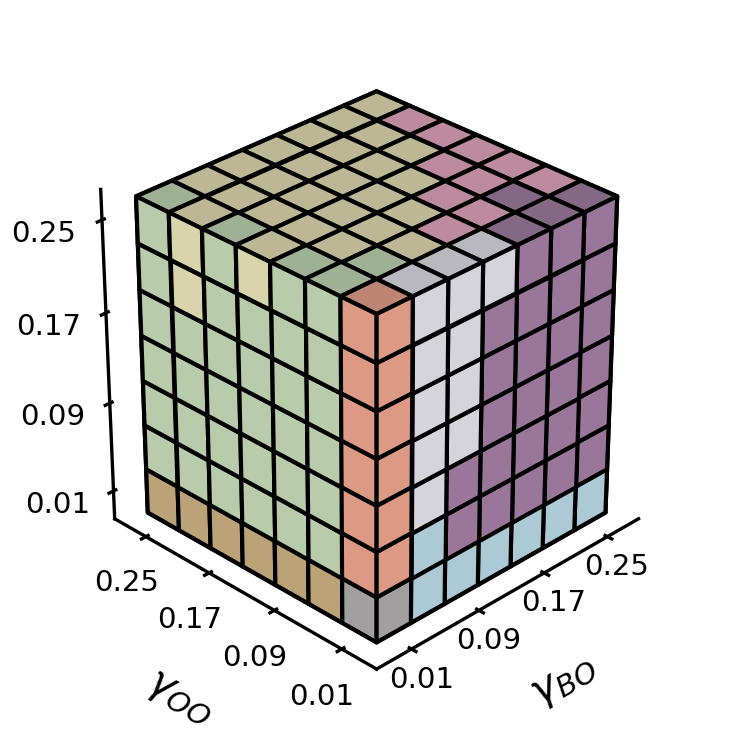

In [5]:
x,y,z = np.indices((7,7,7))

x = x + 1
y = y + 1
z = z + 1
pieces = [] 

for i in range(14):
    chunki = (TrueM[x,y,z] == i)
    pieces.append(chunki)
    
voxel = np.ones((7,7,7), dtype=bool)

colorsv = np.empty(voxel.shape, dtype=object)

for k in range(14):
    colorsv[pieces[k]] = num2col[k]

ax = plt.figure(figsize=(2,2), dpi=300, facecolor="none").add_subplot(projection='3d')
ax.voxels(voxel, facecolors=colorsv, edgecolor='k')

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
ax.xaxis.pane.set_edgecolor('none')
ax.yaxis.pane.set_edgecolor('none')
ax.zaxis.pane.set_edgecolor('none')

plt.xticks([0.5, 2.5, 4.5, 6.5], [0.01, 0.09, 0.17, 0.25], fontsize=7)
plt.yticks([0.5, 2.5, 4.5, 6.5], [0.01, 0.09, 0.17, 0.25], fontsize=7)

ax.set_zticks([0.5, 2.5, 4.5, 6.5])
ax.set_zticklabels([0.01, 0.09, 0.17, 0.25], fontsize=7)

ax.set_xlabel('$\gamma_{BO}$', fontsize=10, labelpad=-5)
ax.set_ylabel('$\gamma_{OO}$', fontsize=10, labelpad=-2)
ax.set_zlabel('$\gamma_{BB}$', fontsize=10, labelpad=0)

ax.tick_params(axis='x', pad=-5)
ax.tick_params(axis='y', pad=-2)
ax.tick_params(axis='z', pad=1)

ax.grid(False)

# 45, 90+45
ax.view_init(azim=180+45)

plt.tight_layout()
plt.subplots_adjust(left=-0.2)
plt.subplots_adjust(bottom=-0.2)

plt.show()

#### Sliced Cube View

- Reference: https://www.mathworks.com/help/matlab/ref/slice.html

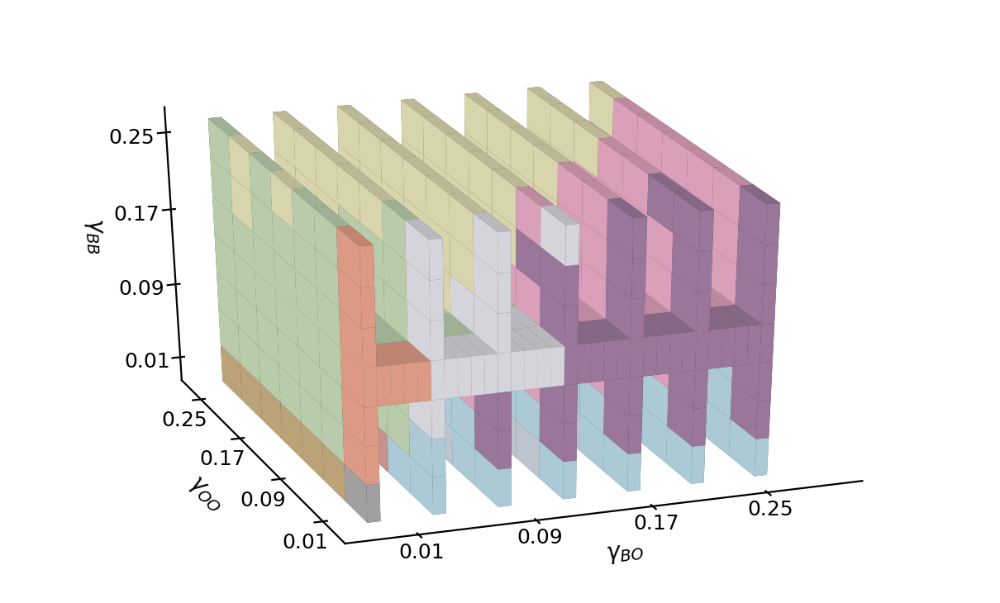

In [6]:
x,y,z = np.indices((7,7,7))
x = x + 1
y = y + 1
z = z + 1
pieces = [] 

for i in range(14):
    chunki = (TrueM[x,y,z] == i)
    spacedchunk = np.zeros((35,7,7), np.bool)
    for j in range(7):
        spacedchunk[5*j,:,:] = chunki[j,:,:]
        if(j != 6):
            spacedchunk[5*j+1:5*(j+1),:,3] = chunki[j,:,3]
    pieces.append(spacedchunk)

voxel = (sum(pieces) > 0)

colorsv = np.empty(voxel.shape, dtype=object)

for k in range(14):
    colorsv[pieces[k]] = num2col[k]

ax = plt.figure(figsize=(5,3), dpi=200, facecolor="none").add_subplot(projection='3d')
ax.voxels(voxel, facecolors=colorsv, edgecolor='none')

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
ax.xaxis.pane.set_edgecolor('none')
ax.yaxis.pane.set_edgecolor('none')
ax.zaxis.pane.set_edgecolor('none')

plt.xticks([3,12, 21, 30], [0.01, 0.09, 0.17, 0.25], fontsize=9)
plt.yticks([0.5, 2.5, 4.5, 6.5], [0.01, 0.09, 0.17, 0.25], fontsize=9)

ax.set_zticks([0.5, 2.5, 4.5, 6.5])
ax.set_zticklabels([0.01, 0.09, 0.17, 0.25], fontsize=9)

ax.set_xlabel('$\gamma_{BO}$', fontsize=10, labelpad=-5)
ax.set_ylabel('$\gamma_{OO}$', fontsize=10, labelpad=-2)
ax.set_zlabel('$\gamma_{BB}$', fontsize=10, labelpad=0)

ax.tick_params(axis='x', pad=-5)
ax.tick_params(axis='y', pad=-2)
ax.tick_params(axis='z', pad=1)

ax.grid(False)

# 45, 90+45
ax.view_init(azim=180+70)

plt.tight_layout()
plt.subplots_adjust(left=-0.2)
plt.subplots_adjust(bottom=-0.2)

plt.show()

#### Helper Functions

In [7]:
def idx2sim(i, j, k):
    
    # i: Adhesion B-B
    # j: Adhesion O-O
    # k: Adhesion B-O

    return 1 + i + 8*j + 64*k

def idx2param(i, j, k):

    a_vals = [0.00, 0.01, 0.05, 0.09, 0.13, 0.17, 0.21, 0.25]
    
    return (a_vals[i], a_vals[j], a_vals[k])

def param2idx(BB, OO, OB):
    
    a_vals = [0.00, 0.01, 0.05, 0.09, 0.13, 0.17, 0.21, 0.25]
    
    BB_idx = -1
    OO_idx = -1
    OB_idx = -1
    
    cnt = 0
    for adh in a_vals:
        
        if np.isclose(BB, adh):
            BB_idx = cnt
        
        if np.isclose(OO, adh):
            OO_idx = cnt
            
        if np.isclose(OB, adh):
            OB_idx = cnt
        
        cnt += 1
        
    return (BB_idx, OO_idx, OB_idx)

#### Data Loaders

In [8]:
def get_npy_data_img(listfoldertypes, numsims, timestep, dimension, dimensionreduction):
    
    totalfiles = len(listfoldertypes)*numsims;
    dimstring = "H" + str(dimension)
    listofnparrayg = []
    listofnparrayr = []
    listofnparraygr = []
    listofadhvals = []
    listofsimnums = []
    
    for val in listfoldertypes:
        
        for i in range(1, numsims+1):
            
            filepath = val + os.sep + 'ParamSweep_' + str(i) + '_Output_persimg_serialize' + os.sep + str(timestep).zfill(7) + ".npy"            
            singlefile = np.load(filepath, allow_pickle = True).item()
            
            dimdatag = singlefile[dimstring][0]
            dimdatag = np.nan_to_num(dimdatag)
            
            dimdatar = singlefile[dimstring][1]
            dimdatar = np.nan_to_num(dimdatar)
            
            dimdatagr = singlefile[dimstring][2]
            dimdatagr = np.nan_to_num(dimdatagr)
            
            listofnparrayg.append(dimdatag)
            listofnparrayr.append(dimdatar)
            listofnparraygr.append(dimdatagr)
            
            param_file = "../simdata/mat_files/ParamSweep_" + str(i) + ".mat"
            mat_data = scipy.io.loadmat(param_file)
            RR = np.round(mat_data['RR'][0][0], 2)
            GG = np.round(mat_data['GG'][0][0], 2)
            RG = np.round(mat_data['RG'][0][0], 2)
            (RR_idx, GG_idx, RG_idx) = param2idx(RR, GG, RG)
            col_idx = TrueM[RG_idx][RR_idx][GG_idx]
            col = num2col[col_idx]
            symb = num2sim[col_idx]
            simulation_number = 1 + GG_idx + 8*RG_idx + 64*RR_idx
            # Assume: green = blue, red = orange
            listofadhvals.append((RR, GG, RG, RR_idx, GG_idx, RG_idx, col, symb))
            listofsimnums.append(simulation_number)
            
    if (dimensionreduction == "pca"):
        
        listofnparrayg = perform_pca(listofnparrayg)
        listofnparrayr = perform_pca(listofnparrayr)
        listofnparraygr = perform_pca(listofnparraygr)
        
    elif(dimensionreduction == "tsne"):
        
        listofnparrayg = perform_tsne(listofnparrayg)
        listofnparrayr = perform_tsne(listofnparrayr)
        listofnparraygr = perform_tsne(listofnparraygr)
        
    elif (dimensionreduction == "mds"):
        
        listofnparrayg = perform_mds(listofnparrayg)
        listofnparrayr = perform_mds(listofnparrayr)
        listofnparraygr = perform_mds(listofnparraygr)
        
    fulldimdata = np.hstack((listofnparrayg,listofnparrayr))
    fulldimdata = np.hstack((fulldimdata,listofnparraygr))

    return (np.array(fulldimdata), listofadhvals, listofsimnums)


def get_npy_data_op(listfoldertypes, numsims, timestep, optype, dimensionreduction):
    
    totalfiles = len(listfoldertypes)*numsims;
    listofnparrayg = []
    listofnparrayr = []
    listofnparraygr = []
    listofadhvals = []
    listofsimnums = []
    
    for val in listfoldertypes:
        
        for i in range(1, numsims+1):
            
            filepath = val + os.sep + 'ParamSweep_' + str(i) + '_Output_OP_serialize/AngDist.npy'           
            op_ang = np.load(filepath, allow_pickle = True).item()
            
            filepath = val + os.sep + 'ParamSweep_' + str(i) + '_Output_OP_serialize/RadDist.npy'           
            op_rad = np.load(filepath, allow_pickle = True).item()
            
            if optype == "rad":
                red_feat_vec = np.hstack((np.nan_to_num(op_rad['homotypic_red']),
                                         np.nan_to_num(op_rad['heterotypic_red']))) 

                green_feat_vec = np.hstack((np.nan_to_num(op_rad['homotypic_green']),
                                         np.nan_to_num(op_rad['heterotypic_green'])))

                all_feat_vec = np.hstack((np.nan_to_num(op_rad['homotypic_all']),
                                         np.nan_to_num(op_rad['heterotypic_all']))) 
            elif optype == "ang":
                red_feat_vec = np.nan_to_num(op_ang['red'])

                green_feat_vec = np.nan_to_num(op_ang['green'])

                all_feat_vec = np.nan_to_num(op_ang['all'])
            else:
                return None
            
            listofnparrayr.append(red_feat_vec)
            listofnparrayg.append(green_feat_vec)
            listofnparraygr.append(all_feat_vec)
            
            param_file = "../simdata/mat_files/ParamSweep_" + str(i) + ".mat"
            mat_data = scipy.io.loadmat(param_file)
            RR = np.round(mat_data['RR'][0][0], 2)
            GG = np.round(mat_data['GG'][0][0], 2)
            RG = np.round(mat_data['RG'][0][0], 2)
            (RR_idx, GG_idx, RG_idx) = param2idx(RR, GG, RG)
            col_idx = TrueM[RG_idx][RR_idx][GG_idx]
            col = num2col[col_idx]
            symb = num2sim[col_idx]
            simulation_number = 1 + GG_idx + 8*RG_idx + 64*RR_idx
            # Assume: green = blue, red = orange
            listofadhvals.append((RR, GG, RG, RR_idx, GG_idx, RG_idx, col, symb))
            listofsimnums.append(simulation_number)
            
    if (dimensionreduction == "pca"):
        
        listofnparrayg = perform_pca(listofnparrayg)
        listofnparrayr = perform_pca(listofnparrayr)
        listofnparraygr = perform_pca(listofnparraygr)
        
    elif(dimensionreduction == "tsne"):
        
        listofnparrayg = perform_tsne(listofnparrayg)
        listofnparrayr = perform_tsne(listofnparrayr)
        listofnparraygr = perform_tsne(listofnparraygr)
        
    elif (dimensionreduction == "mds"):
        
        listofnparrayg = perform_mds(listofnparrayg)
        listofnparrayr = perform_mds(listofnparrayr)
        listofnparraygr = perform_mds(listofnparraygr)
        
    fulldimdata = np.hstack((listofnparrayg,listofnparrayr))
    fulldimdata = np.hstack((fulldimdata,listofnparraygr))

    return (np.array(fulldimdata), listofadhvals, listofsimnums)


def get_npy_data_curve(listfoldertypes, numsims, timestep, dimension, dimensionreduction):
    
    totalfiles = len(listfoldertypes)*numsims;
    dimstring = "H" + str(dimension)
    listofnparrayg = []
    listofnparrayr = []
    listofnparraygr = []
    listofadhvals = []
    listofsimnums = []
    
    for val in listfoldertypes:
        
        for i in range(1, numsims+1):
            
            filepath = val + os.sep + 'ParamSweep_' + str(i) + '_Output_perscurve_serialize' + os.sep + str(timestep).zfill(7) + ".npy"
            singlefile = np.load(filepath, allow_pickle = True).item()
            
            dimdatag = singlefile[dimstring][0]
            dimdatag = np.nan_to_num(dimdatag)
            dimdatar = singlefile[dimstring][1]
            dimdatar = np.nan_to_num(dimdatar)
            dimdatagr = singlefile[dimstring][2]
            dimdatagr = np.nan_to_num(dimdatagr)
            listofnparrayg.append(dimdatag)
            listofnparrayr.append(dimdatar)
            listofnparraygr.append(dimdatagr)
            
            param_file = "../simdata/mat_files/ParamSweep_" + str(i) + ".mat"
            mat_data = scipy.io.loadmat(param_file)
            RR = np.round(mat_data['RR'][0][0], 2)
            GG = np.round(mat_data['GG'][0][0], 2)
            RG = np.round(mat_data['RG'][0][0], 2)
            (RR_idx, GG_idx, RG_idx) = param2idx(RR, GG, RG)
            col_idx = TrueM[RG_idx][RR_idx][GG_idx]
            col = num2col[col_idx]
            symb = num2sim[col_idx]
            simulation_number = 1 + GG_idx + 8*RG_idx + 64*RR_idx
            # Assume: green = blue, red = orange
            listofadhvals.append((RR, GG, RG, RR_idx, GG_idx, RG_idx, col, symb))
            listofsimnums.append(simulation_number)
            
    if (dimensionreduction == "pca"):
        
        listofnparrayg = perform_pca(listofnparrayg)
        listofnparrayr = perform_pca(listofnparrayr)
        listofnparraygr = perform_pca(listofnparraygr)
        
    elif (dimensionreduction == "tsne"):
        
        listofnparrayg = perform_tsne(listofnparrayg)
        listofnparrayr = perform_tsne(listofnparrayr)
        listofnparraygr = perform_tsne(listofnparraygr)
        
    elif (dimensionreduction == "mds"):
        
        listofnparrayg = perform_mds(listofnparrayg)
        listofnparrayr = perform_mds(listofnparrayr)
        listofnparraygr = perform_mds(listofnparraygr)
        
    fulldimdata = np.hstack((listofnparrayg, listofnparrayr))
    fulldimdata = np.hstack((fulldimdata, listofnparraygr))

    return (np.array(fulldimdata), listofadhvals, listofsimnums)
    
        
def unison_shuffled_copies(listoflistshuffled):
    
    p = np.random.permutation(len(listoflistshuffled[0]))
    shuffledlist = []
    
    for val in listoflistshuffled:
        shuffled = val[p]
        shuffledlist.append(shuffled)
        
    return shuffledlist 


def kmeansclust(h0data, h1data, h2data, useh0, useh1, useh2):
    
    if(useh0):
        kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
        pred_y = kmeans.fit_predict(h0data)
        return pred_y
    
    elif(useh1):
        kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
        pred_y = kmeans.fit_predict(h1data) 
        return pred_y
    
    elif(useh2):
        kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
        pred_y = kmeans.fit_predict(h2data) 
        return pred_y

    
def opticsclust(homology_dat):
    
    clusterf = OPTICS(min_samples=4, metric='euclidean').fit(homology_dat)
    return clusterf.labels_
    
    
def dbscanclust(homology_dat):
    
    clusters = DBSCAN(eps=1.36, min_samples=4).fit(homology_dat)
    return clusters.labels_


def perform_pca(datatochange):
    
    x = StandardScaler().fit_transform(datatochange)
    pca = PCA(n_components=5, svd_solver="auto")
    principalComponents = pca.fit_transform(x)
    return principalComponents


def perform_tsne(datatochange):
    
    X_embedded = TSNE(n_components=3).fit_transform(datatochange)
    return X_embedded;


def perform_mds(datatochange):
    
    embedding = MDS(n_components=10)
    X_transformed = embedding.fit_transform(datatochange)
    return X_transformed

#### Plot 2D Embedding

In [9]:
def dim_reduction_plot(X_coords, Y_coords, C_grnd_truth, plt_markers, C_hetero, C_homo_OO, C_homo_BB, title):
    
    plt.figure(figsize=(2,2), dpi=400)
    for i in range(np.shape(X_coords)[0]):
        plt.scatter(X_coords[i], Y_coords[i], s=8, c=C_grnd_truth[i], 
                    marker=plt_markers[i], edgecolors='darkgray', linewidth=0.1, alpha=0.6)
    plt.xticks([])
    plt.yticks([])
    ax = plt.gca()
    ax.set_facecolor((0.4, 0.4, 0.4))
    plt.xlabel(title + " 1", fontsize=7)
    plt.ylabel(title + " 2", fontsize=7)
    plt.show()

    fig, axes = plt.subplots(1, 3, figsize=(12,3), dpi=500)

    p1 = axes[0].scatter(X_coords, Y_coords, s=15, c=C_hetero, edgecolors='gray', linewidth=0.1, cmap="Reds")
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    axes[0].set_facecolor((0.6, 0.6, 0.6))
    axes[0].set_title(r"$\gamma_{BO}$", fontsize=15)
    #fig.colorbar(p1, ax=axes[0])

    p2 = axes[1].scatter(X_coords, Y_coords, s=15, c=C_homo_OO, edgecolors='gray', linewidth=0.1, cmap="Reds")
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    axes[1].set_facecolor((0.6, 0.6, 0.6))
    axes[1].set_title(r"$\gamma_{OO}$", fontsize=15)
    #fig.colorbar(p2, ax=axes[1])

    p3 = axes[2].scatter(X_coords, Y_coords, s=15, c=C_homo_BB, edgecolors='gray', linewidth=0.1, cmap="Reds")
    axes[2].set_xticks([])
    axes[2].set_yticks([])
    axes[2].set_facecolor((0.6, 0.6, 0.6))
    axes[2].set_title(r"$\gamma_{BB}$", fontsize=15)
    #fig.colorbar(p3, ax=axes[2])
    
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.01, 0.7])
    fig.colorbar(p3, cax=cbar_ax)

    plt.show()

#### Visualize Simulation

In [10]:
sim_id = 120

filepath = 'persimg/ParamSweep_' + str(sim_id) + '_Output_persimg_serialize/5000000.npy' 
pimg = np.load(filepath, allow_pickle = True).item()

print("\nPersistence Images:")
print(np.shape(pimg['H0']))
print(np.shape(pimg['H1']))
print(np.shape(pimg['H2']))

filepath = 'perscurve/ParamSweep_' + str(sim_id) + '_Output_perscurve_serialize/5000000.npy' 
pcur = np.load(filepath, allow_pickle = True).item()

print("\nPersistence Curves:")
print(np.shape(pcur['H0']))
print(np.shape(pcur['H1']))
print(np.shape(pcur['H2']))

filepath = 'orderparamnpy/ParamSweep_' + str(sim_id) + '_Output_OP_serialize/AngDist.npy' 
opang = np.load(filepath, allow_pickle = True).item()

print("\nAngular Distribution:")
print(np.shape(opang['red']))
print(np.shape(opang['green']))
print(np.shape(opang['all']))

filepath = 'orderparamnpy/ParamSweep_' + str(sim_id) + '_Output_OP_serialize/RadDist.npy' 
oprad = np.load(filepath, allow_pickle = True).item()

print("\nHomotypic Radial Distribution:")
print(np.shape(oprad['homotypic_red']))
print(np.shape(oprad['homotypic_green']))
print(np.shape(oprad['homotypic_all']))

print("\nHeterotypic Radial Distribution:")
print(np.shape(oprad['heterotypic_red']))
print(np.shape(oprad['heterotypic_green']))
print(np.shape(oprad['heterotypic_all']))


Persistence Images:
(3, 100)
(3, 5000)
(3, 5000)

Persistence Curves:
(3, 200)
(3, 200)
(3, 200)

Angular Distribution:
(100,)
(100,)
(100,)

Homotypic Radial Distribution:
(100,)
(100,)
(100,)

Heterotypic Radial Distribution:
(100,)
(100,)
(100,)


#### Load Data

In [11]:
feat_name = "persimg"

if feat_name == "orderparamnpy":
    
    (vec_imgs_dim0, param_vals_0, simnums_0) = get_npy_data_op([feat_name], 512, 5000000, "rad", "")
    (vec_imgs_dim1, param_vals_1, simnums_1) = get_npy_data_op([feat_name], 512, 5000000, "ang", "")
    vec_imgs = np.hstack((vec_imgs_dim0, vec_imgs_dim1))
    
elif feat_name == "persimg":
    
    (vec_imgs_dim0, param_vals_0, simnums_0) = get_npy_data_img([feat_name], 512, 5000000, 0, "")
    (vec_imgs_dim1, param_vals_1, simnums_1) = get_npy_data_img([feat_name], 512, 5000000, 1, "")
    vec_imgs = np.hstack((vec_imgs_dim0, vec_imgs_dim1))
    
elif feat_name == "perscurve":
    
    (vec_imgs_dim0, param_vals_0, simnums_0) = get_npy_data_curve([feat_name], 512, 5000000, 0, "")
    (vec_imgs_dim1, param_vals_1, simnums_1) = get_npy_data_curve([feat_name], 512, 5000000, 1, "")
    vec_imgs = np.hstack((vec_imgs_dim0, vec_imgs_dim1))

else:
    
    print("Feature not recognized!")
    
H0_homo_adh_OO = [tmp[0] for tmp in param_vals_0]
H0_homo_adh_BB = [tmp[1] for tmp in param_vals_0]
H0_hetero_adh = [tmp[2] for tmp in param_vals_0]
H0_grnd_truth = [tmp[6] for tmp in param_vals_0]
H0_plot_marker = [tmp[7] for tmp in param_vals_0]

H1_homo_adh_OO = [tmp[0] for tmp in param_vals_1]
H1_homo_adh_BB = [tmp[1] for tmp in param_vals_1]
H1_hetero_adh = [tmp[2] for tmp in param_vals_1]
H1_grnd_truth = [tmp[6] for tmp in param_vals_1]
H1_plot_marker = [tmp[7] for tmp in param_vals_1]

#### UMAP

In [12]:
H0_umap = umap.UMAP(n_neighbors=5, random_state=42).fit(vec_imgs_dim0)
H1_umap = umap.UMAP(n_neighbors=5, random_state=42).fit(vec_imgs_dim1)
H01_umap = umap.UMAP(n_neighbors=5, random_state=42).fit(vec_imgs)

/home/labmember/anaconda2/envs/py36/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 4 separate connected components using meta-embedding (experimental)
  n_components
/home/labmember/anaconda2/envs/py36/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components
/home/labmember/anaconda2/envs/py36/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 4 separate connected components using meta-embedding (experimental)
  n_components


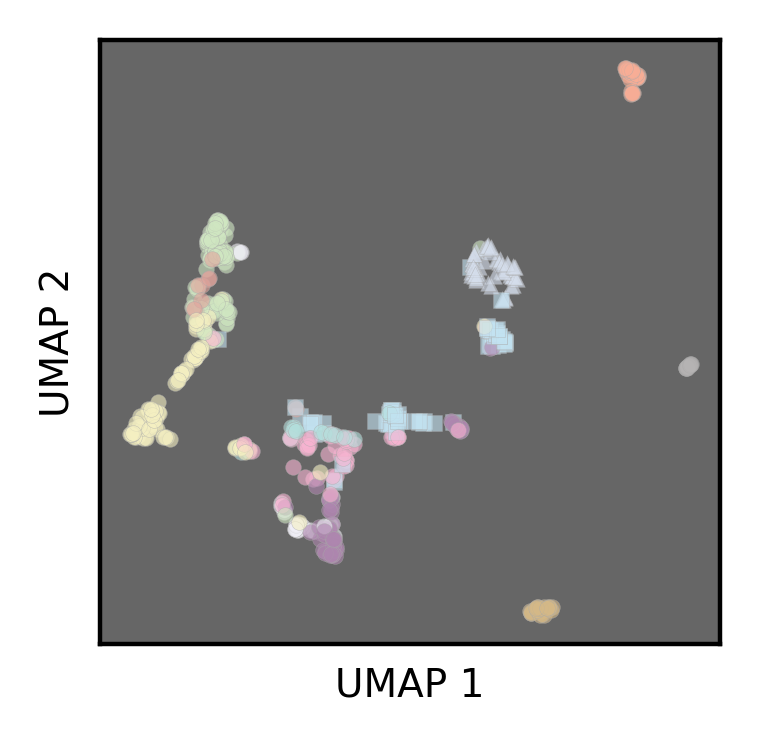

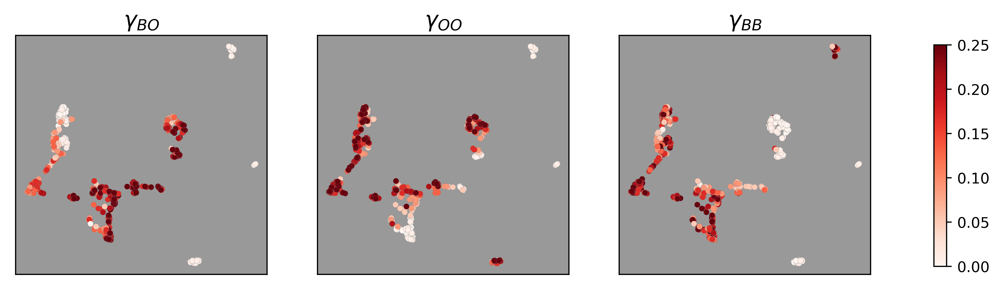

In [13]:
dim_reduction_plot(H0_umap.embedding_[:, 0], H0_umap.embedding_[:, 1], H0_grnd_truth, H0_plot_marker,
                   H0_hetero_adh, H0_homo_adh_OO, H0_homo_adh_BB, "UMAP")

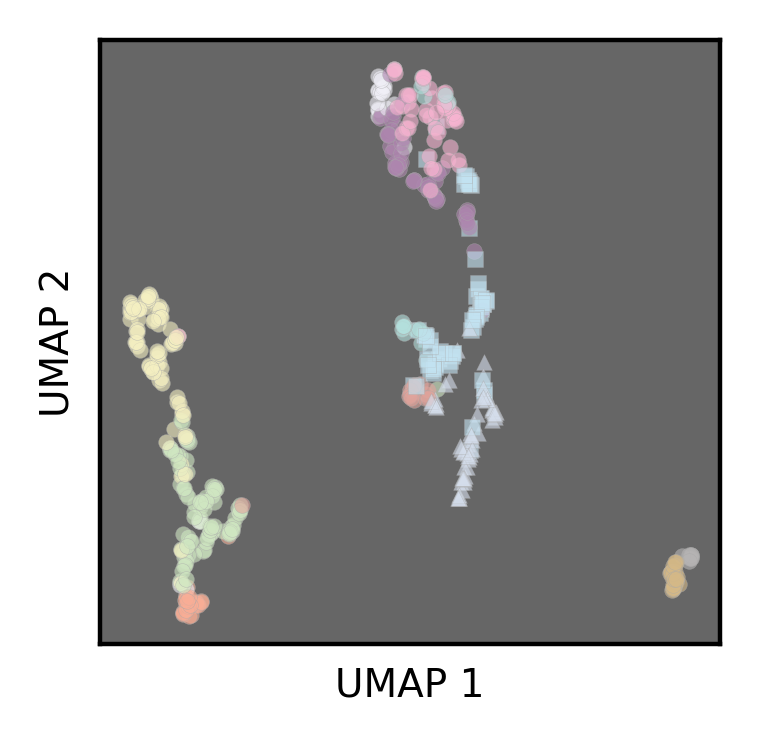

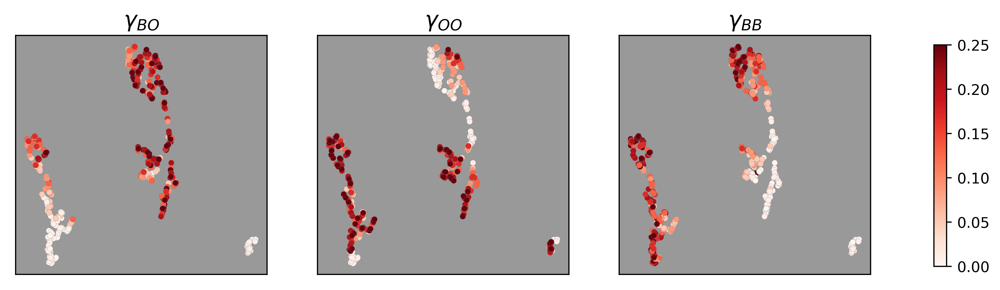

In [14]:
dim_reduction_plot(H1_umap.embedding_[:, 0], H1_umap.embedding_[:, 1], H1_grnd_truth, H1_plot_marker,
                   H1_hetero_adh, H1_homo_adh_OO, H1_homo_adh_BB, "UMAP")

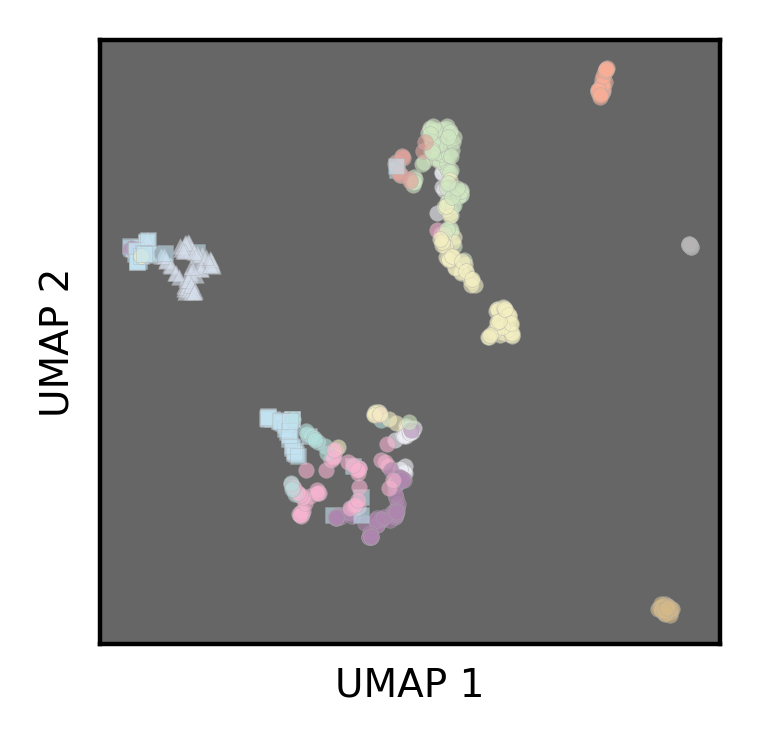

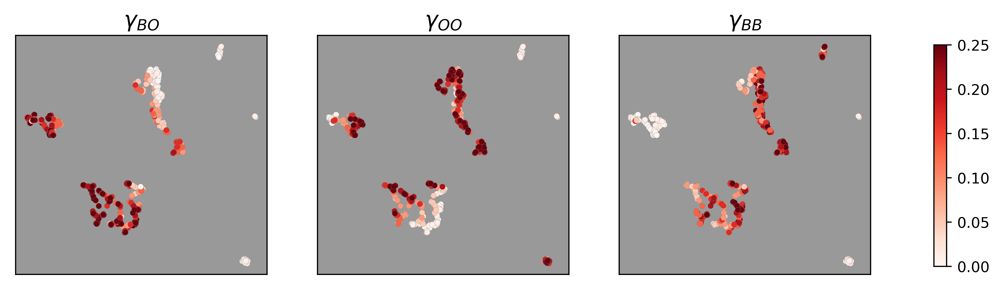

In [15]:
dim_reduction_plot(H01_umap.embedding_[:, 0], H01_umap.embedding_[:, 1], H0_grnd_truth, H0_plot_marker, 
                   H0_hetero_adh, H0_homo_adh_OO, H0_homo_adh_BB, "UMAP")

#### PHATE

In [16]:
phate_operator = phate.PHATE(n_jobs=-2)
H0_phate = phate_operator.fit_transform(vec_imgs_dim0)
H1_phate = phate_operator.fit_transform(vec_imgs_dim1)
H01_phate = phate_operator.fit_transform(vec_imgs)

Calculating PHATE...
  Running PHATE on 512 observations and 300 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.03 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
  Calculated graph and diffusion operator in 0.16 seconds.
  Calculating optimal t...
    Automatically selected t = 18
  Calculated optimal t in 0.07 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.02 seconds.
  Calculating metric MDS...


/home/labmember/anaconda2/envs/py36/lib/python3.6/site-packages/graphtools/graphs.py:284: RuntimeWarning: Detected zero distance between samples 165 and 341. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


  Calculated metric MDS in 0.19 seconds.
Calculated PHATE in 0.45 seconds.
Calculating PHATE...
  Running PHATE on 512 observations and 15000 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.56 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.10 seconds.
    Calculating affinities...
    Calculated affinities in 0.11 seconds.
  Calculated graph and diffusion operator in 0.78 seconds.
  Calculating optimal t...
    Automatically selected t = 27
  Calculated optimal t in 0.08 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.02 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 0.19 seconds.
Calculated PHATE in 1.08 seconds.
Calculating PHATE...
  Running PHATE on 512 observations and 15300 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.54 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.10

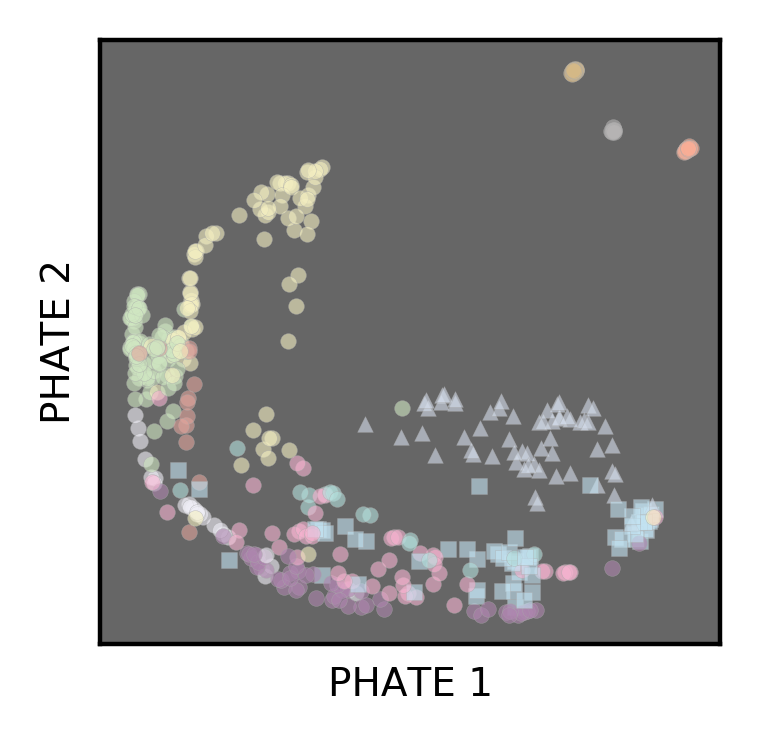

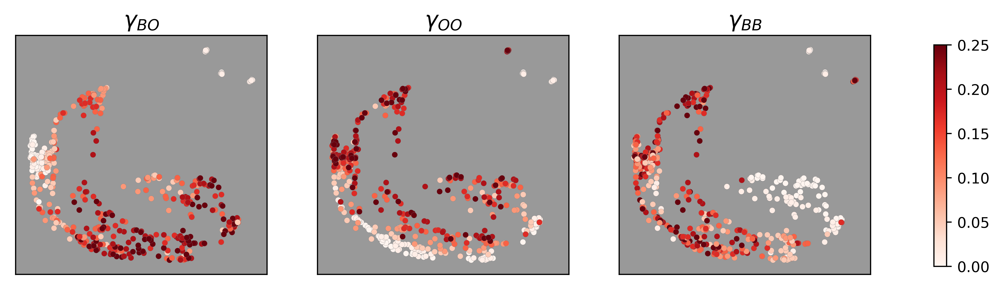

In [17]:
dim_reduction_plot(H0_phate[:, 0], H0_phate[:, 1], H0_grnd_truth, H0_plot_marker, 
                   H0_hetero_adh, H0_homo_adh_OO, H0_homo_adh_BB, "PHATE")

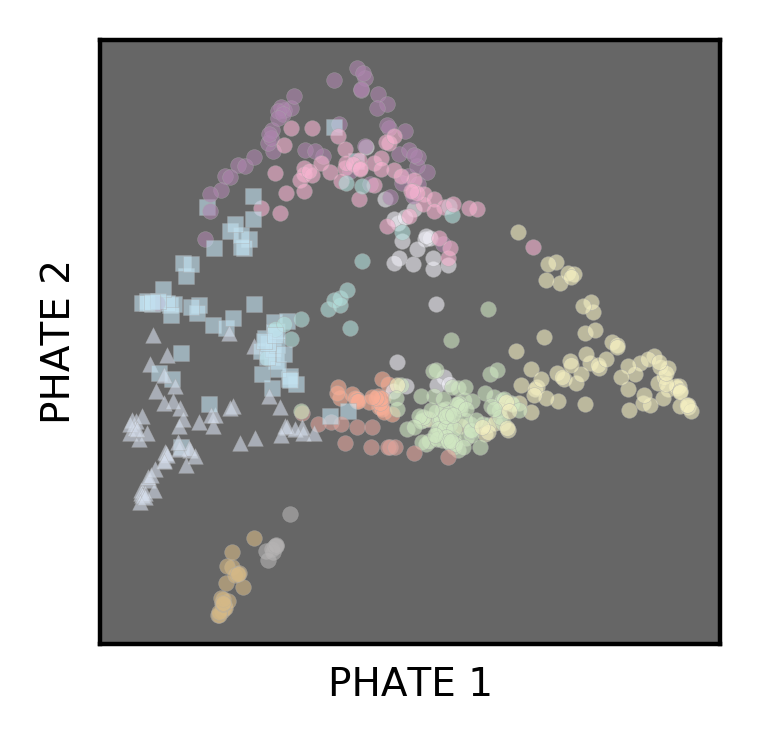

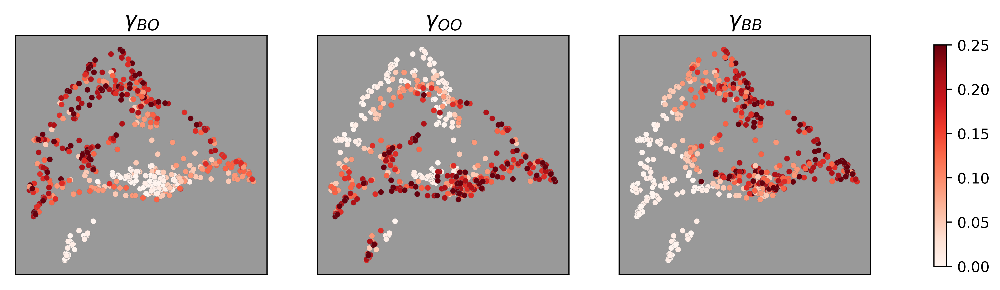

In [18]:
dim_reduction_plot(H1_phate[:, 0], H1_phate[:, 1], H1_grnd_truth, H1_plot_marker, 
                   H1_hetero_adh, H1_homo_adh_OO, H1_homo_adh_BB, "PHATE")

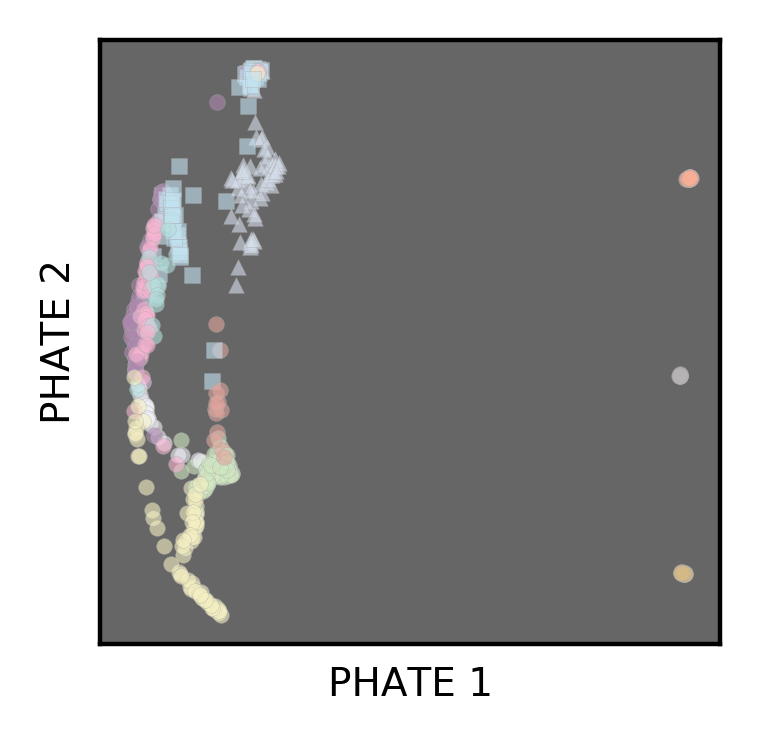

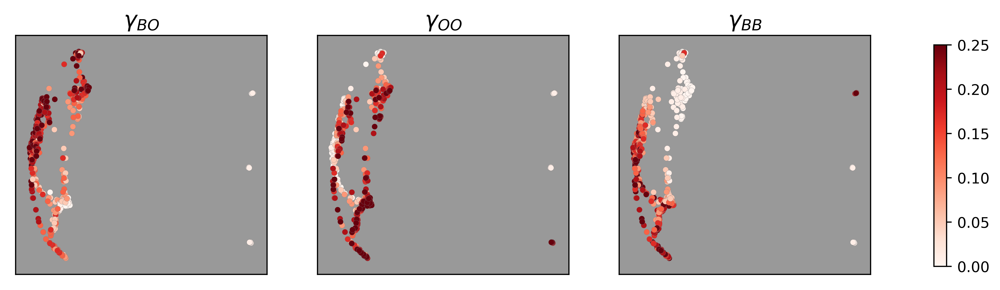

In [19]:
dim_reduction_plot(H01_phate[:, 0], H01_phate[:, 1], H0_grnd_truth, H0_plot_marker, 
                   H0_hetero_adh, H0_homo_adh_OO, H0_homo_adh_BB, "PHATE")

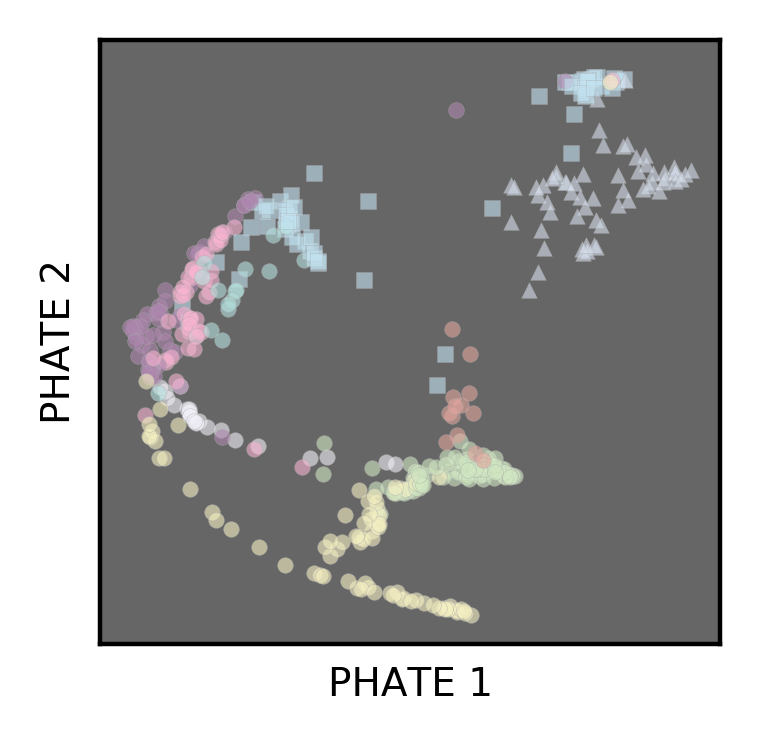

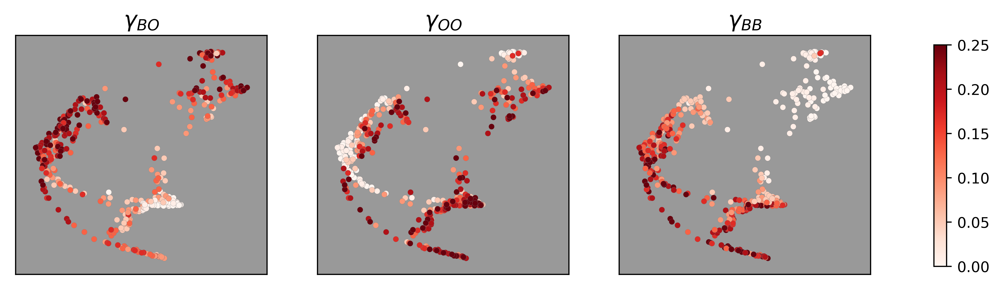

In [20]:
indices = H01_phate[:, 0] < 0.1
H01_collective_X = H01_phate[:, 0][indices]
H01_collective_Y = H01_phate[:, 1][indices]

H01_collective_grnd = []
H01_collective_markers = []
H01_collective_hetero_adh = []
H01_collective_homo_OO_adh = []
H01_collective_homo_BB_adh = []
for i in range(len(indices)):
    if(indices[i]):
        H01_collective_grnd.append(H0_grnd_truth[i])
        H01_collective_markers.append(H0_plot_marker[i])
        H01_collective_hetero_adh.append(H0_hetero_adh[i])
        H01_collective_homo_OO_adh.append(H0_homo_adh_OO[i])
        H01_collective_homo_BB_adh.append(H0_homo_adh_BB[i])

dim_reduction_plot(H01_collective_X, H01_collective_Y, H01_collective_grnd, H01_collective_markers,  
                   H01_collective_hetero_adh, H01_collective_homo_OO_adh, H01_collective_homo_BB_adh, "PHATE")

#### PCA

In [21]:
pca = PCA(n_components=2)
H0_pca = pca.fit(vec_imgs_dim0).transform(vec_imgs_dim0)
H1_pca = pca.fit(vec_imgs_dim1).transform(vec_imgs_dim1)
H01_pca = pca.fit(vec_imgs).transform(vec_imgs)

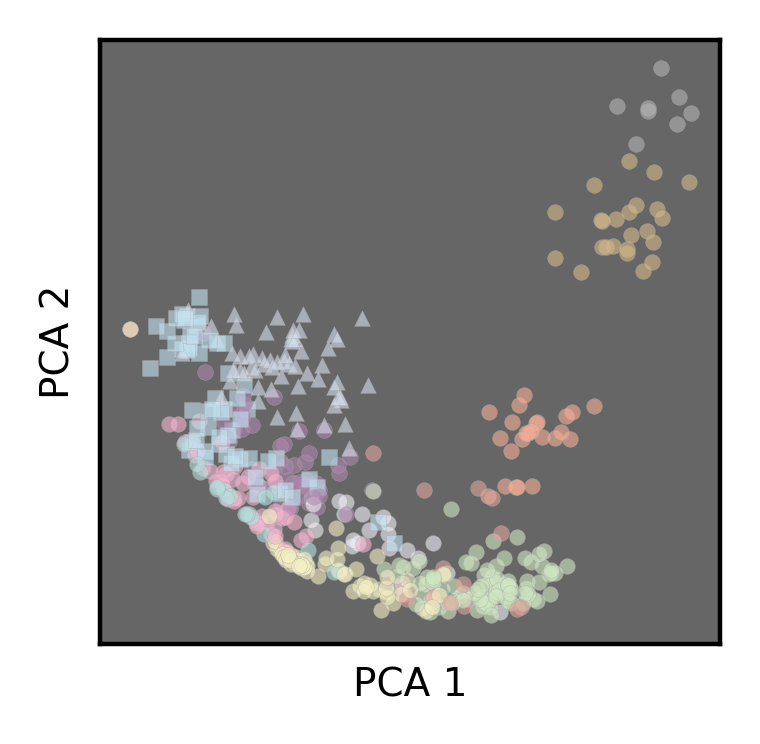

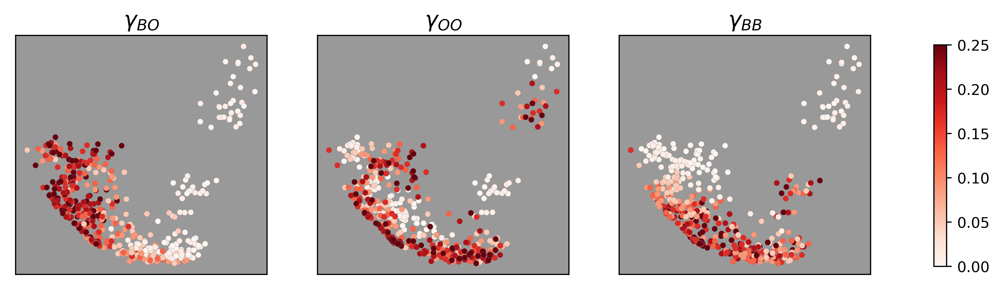

In [22]:
dim_reduction_plot(H0_pca[:, 0], H0_pca[:, 1], H0_grnd_truth, H0_plot_marker, 
                   H0_hetero_adh, H0_homo_adh_OO, H0_homo_adh_BB, "PCA")

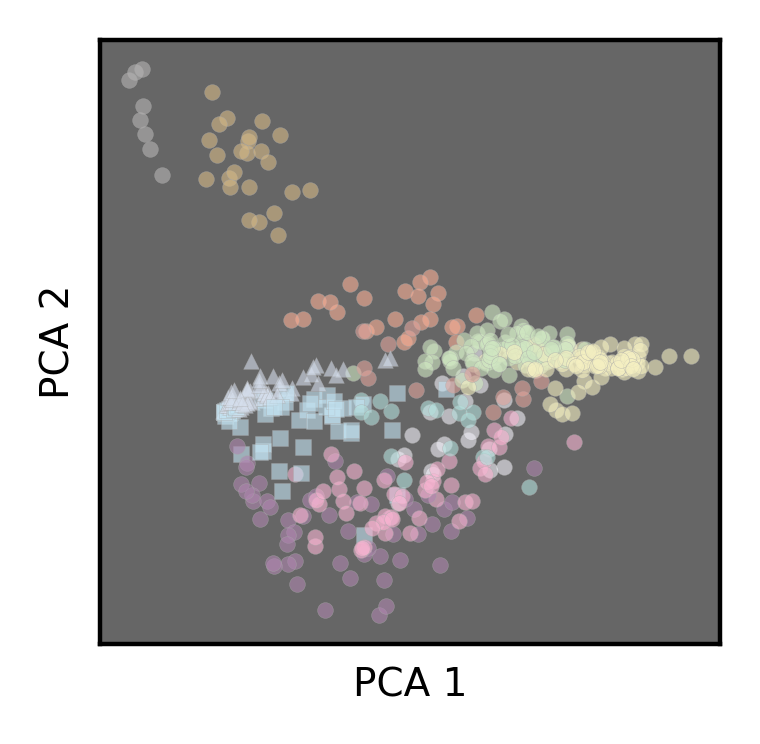

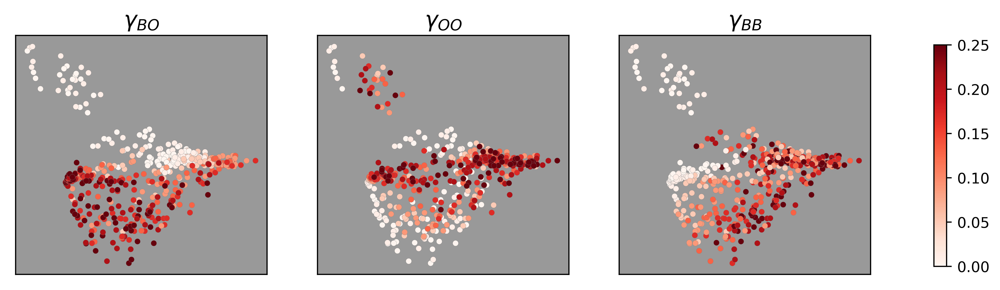

In [23]:
dim_reduction_plot(H1_pca[:, 0], H1_pca[:, 1], H1_grnd_truth, H1_plot_marker,  
                   H1_hetero_adh, H1_homo_adh_OO, H1_homo_adh_BB, "PCA")

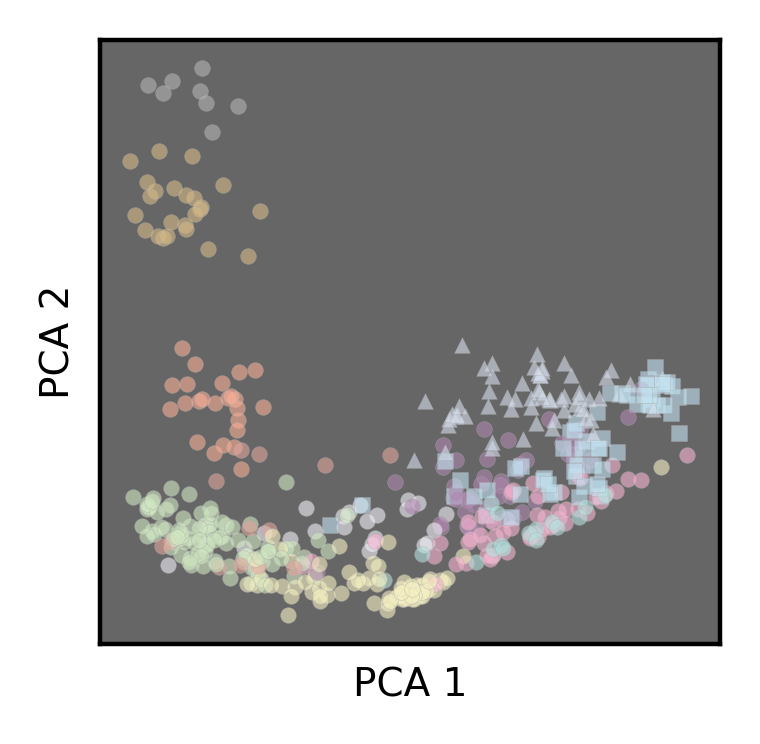

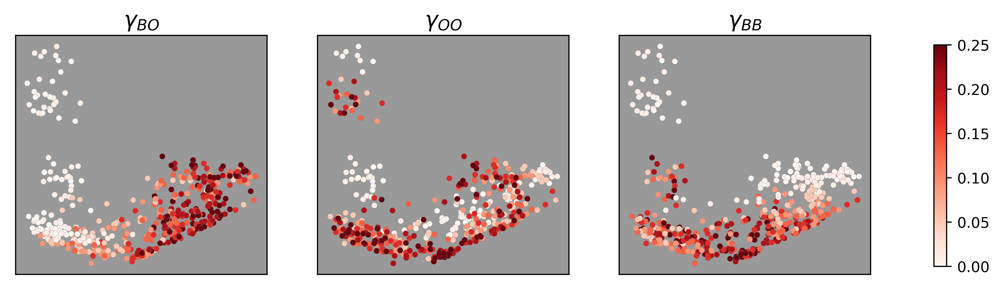

In [24]:
dim_reduction_plot(H01_pca[:, 0], H01_pca[:, 1], H0_grnd_truth, H0_plot_marker,  
                   H0_hetero_adh, H0_homo_adh_OO, H0_homo_adh_BB, "PCA")

#### AutoEncoder

- [TODO] Try Wasserstein regularized AE
    - Use pairwise distance matrix to compute Wasserstein distance between subset of simulations

In [102]:
device = torch.device("cpu")


# Basic MLP encoder block
class Encoder_basic(nn.Module):

    
    def __init__(self, input_dim, hidden_dim1, hidden_dim2, hidden_dim3):
    
        super(Encoder_basic,self).__init__()
        self.linear = nn.Linear(input_dim, hidden_dim1)
        self.linear2 = nn.Linear(hidden_dim1, hidden_dim2)
        self.linear3 = nn.Linear(hidden_dim2, hidden_dim3)
        self.leaky_relu = nn.LeakyReLU(0.1)
        # self.dropout = nn.Dropout(p=0.25)

    def forward(self, x):
    
        hidden1 = self.leaky_relu(self.linear(x))
        hidden2 = self.leaky_relu(self.linear2(hidden1))
        hidden3 = self.leaky_relu(self.linear3(hidden2))

        return hidden3

    
# Decoder with individual bottleneck manifold embedding layer
class Decoder_Manifold(nn.Module):

    
    def __init__(self, manifold_dim, hidden_dim3, hidden_dim2, hidden_dim1, output_dim):
        
        """
        :param manifold_dim: the bottleneck manifold dimensions, e.g. phate/tphate dim
        :param hidden_dim3: the output dim from encoder, this is reused to get symmetric encoder/decoder
        :param hidden_dim2: symmetric to encoder hidden_dim2
        :param hidden_dim1: symmetric to encoder hidden_dim1
        :param output_dim: the reconstructed dim same as encoder input_dim
        """
        super(Decoder_Manifold, self).__init__()
        self.linear_m = nn.Linear(hidden_dim3, manifold_dim)
        self.linear = nn.Linear(manifold_dim, hidden_dim3 )
        self.linear_1 = nn.Linear(hidden_dim3, hidden_dim2)
        self.linear_2 = nn.Linear(hidden_dim2, hidden_dim1)
        self.linear_3 = nn.Linear(hidden_dim1, output_dim)
        self.leaky_relu = nn.LeakyReLU(0.1)

    def forward(self, x):
        
        z = self.linear_m(x)
        hidden3 = self.leaky_relu(self.linear(z))
        hidden2 = self.leaky_relu(self.linear_1(hidden3))
        hidden1 = self.leaky_relu(self.linear_2(hidden2))
        output = self.leaky_relu(self.linear_3(hidden1))
        
        return z, output

# Torch dataset
class Dataset(torch.utils.data.Dataset):

    'Characterizes a dataset for PyTorch'
    def __init__(self, X_train, y_label, param_plot_marker, param_OB_adh, param_OO_adh, param_BB_adh):

        self.X_train = X_train
        self.y_labels = y_label
        self.plot_marker = param_plot_marker
        self.param_OB_adh = param_OB_adh
        self.param_OO_adh = param_OO_adh
        self.param_BB_adh = param_BB_adh

    def __len__(self):
    
        'Denotes the total number of samples'
        return self.X_train.shape[0]

    def __getitem__(self, index):
    
        'Generates one sample of data'
        return self.X_train[index,:], (self.y_labels[index], self.plot_marker[index], self.param_OB_adh[index],
                                       self.param_OO_adh[index], self.param_BB_adh[index])
    
def train_AE(learning_rate, n_epochs, feat_vec, grnd_truth, plt_mrkr, 
             OB_adh_val, OO_adh_val, BB_adh_val, chk_fname):
    
    input_dim = feat_vec.shape[1]
    manifold_dim = 2

    encoder = Encoder_basic(input_dim, 256, 128, 64)
    decoder = Decoder_Manifold(manifold_dim, 64, 128, 250, output_dim=input_dim)
    
    params = list(encoder.parameters()) + list(decoder.parameters())
    optimizer = torch.optim.Adam(params, lr=learning_rate)
    criterion = torch.nn.MSELoss()
    
    params = {'batch_size': 64, 'shuffle': True, 'num_workers': 2}
    
    training_set = Dataset(feat_vec, grnd_truth, plt_mrkr, OB_adh_val, OO_adh_val, BB_adh_val)
    dataloader = torch.utils.data.DataLoader(training_set, **params)
    
    loss_vals = []
    
    for epoch in range(1, n_epochs+1):

        epoch_losses = 0.0
        epoch_rconst_losses = 0.0
        #epoch_manifold_reg_losses = 0.0

        for data_batch, data_batch_params in dataloader:

            optimizer.zero_grad()

            data_batch = data_batch.float()

            hidden = encoder(data_batch)
            embed, output = decoder(hidden)

            loss_reconstruct = criterion(output, data_batch)
            #loss_manifold_reg = mr_criterion(embed, embed_batch)
            loss = loss_reconstruct #+ loss_manifold_reg

            epoch_rconst_losses += loss_reconstruct
            #epoch_manifold_reg_losses += loss_manifold_reg
            epoch_losses += loss

            loss.backward()
            optimizer.step()

        epoch_rconst_losses /= params['batch_size']
        #epoch_manifold_reg_losses /= params['batch_size']
        epoch_losses /= params['batch_size']

        tot_loss = epoch_losses.detach().numpy()
        rconst_loss = epoch_rconst_losses.detach().numpy()
        #manifold_reg_loss = epoch_manifold_reg_losses.detach().numpy()
    
        if epoch % 10 == 0:
            print(f"Epoch ({epoch}/{n_epochs}) \t Net Loss:{tot_loss}")
            
        loss_vals.append(tot_loss)
        
    torch.save({
            'epoch': epoch,
            'encoder_state_dict': encoder.state_dict(),
            'decoder_state_dict': decoder.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss}, chk_fname)
    
    return loss_vals, encoder, decoder, dataloader

def transform_AE(chk_fname, encoder, decoder, dataloader):

    checkpoint = torch.load(chk_fname)
    encoder.load_state_dict(checkpoint['encoder_state_dict'])
    decoder.load_state_dict(checkpoint['decoder_state_dict'])
    params = list(encoder.parameters()) + list(decoder.parameters())

    optimizer = torch.optim.Adam(params, lr=0.0002)
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    
    encoder.eval()
    decoder.eval()
    
    embed_x = []
    embed_y = []
    params_grnd = []
    params_mark = []
    params_OB = []
    params_OO = []
    params_BB = []

    with torch.no_grad():

        for data_batch, data_batch_params in dataloader:

            data_batch = data_batch.float()

            hidden = encoder(data_batch)
            embed, output = decoder(hidden)

            embed_npy = embed.detach().numpy()

            embed_x.extend(embed_npy[:,0])
            embed_y.extend(embed_npy[:,1])
            
            params_grnd.extend(data_batch_params[0])
            params_mark.extend(data_batch_params[1])
            params_OB.extend(data_batch_params[2])
            params_OO.extend(data_batch_params[3])
            params_BB.extend(data_batch_params[4])
            
    embed_x = np.asarray(embed_x)
    embed_y = np.asarray(embed_y)
    
    return (embed_x, embed_y, params_grnd, params_mark, params_OB, params_OO, params_BB)

def plot_loss(n_epochs, loss_vals, title_str):
    
    plt.figure(figsize=(3,1), dpi=300)
    plt.plot(np.arange(n_epochs), loss_vals, linewidth=0.7)
    plt.title(title_str, fontsize=7)
    plt.xticks(fontsize=5)
    plt.yticks(fontsize=5)
    plt.xlabel("Epochs", fontsize=7)
    plt.ylabel("Total Loss", fontsize=7)
    plt.show()

In [103]:
n_epochs = 50

Epoch (10/50) 	 Net Loss:9.910787775879726e-05
Epoch (20/50) 	 Net Loss:5.53489153389819e-05
Epoch (30/50) 	 Net Loss:4.5375221816357225e-05
Epoch (40/50) 	 Net Loss:4.0763174183666706e-05
Epoch (50/50) 	 Net Loss:3.82363868993707e-05


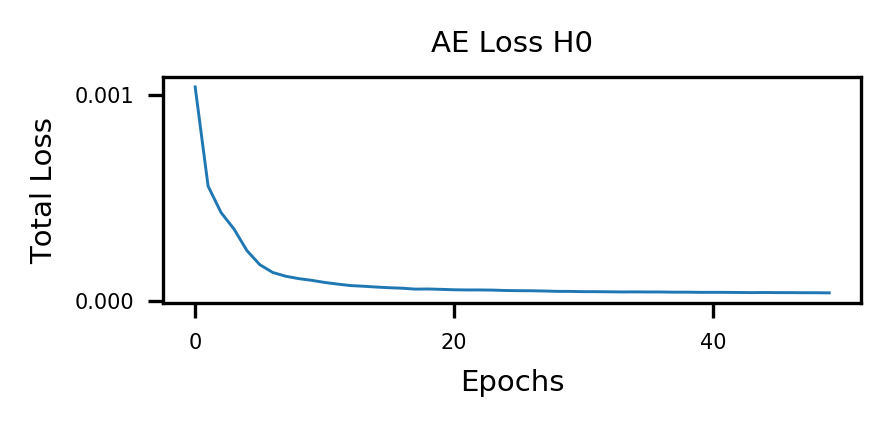

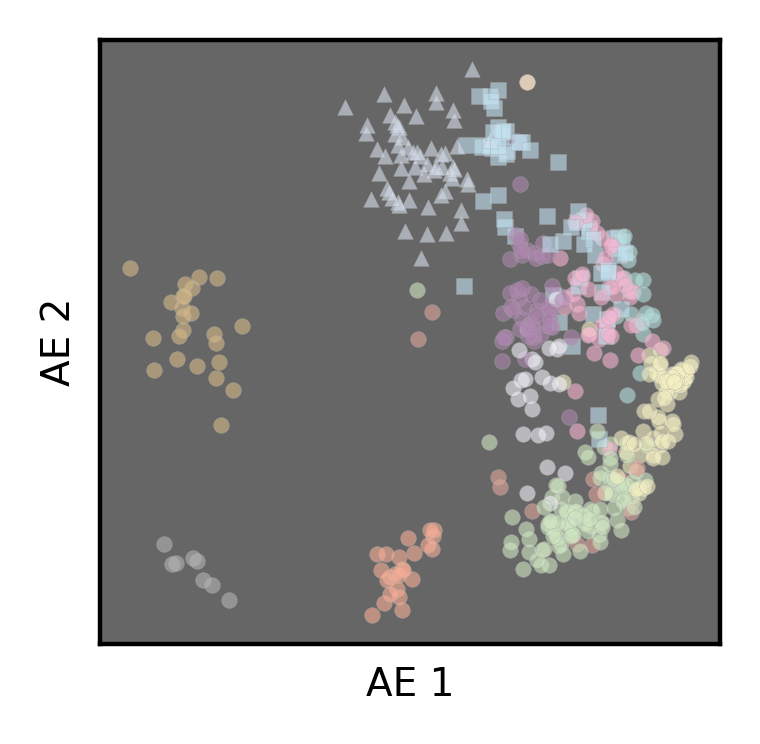

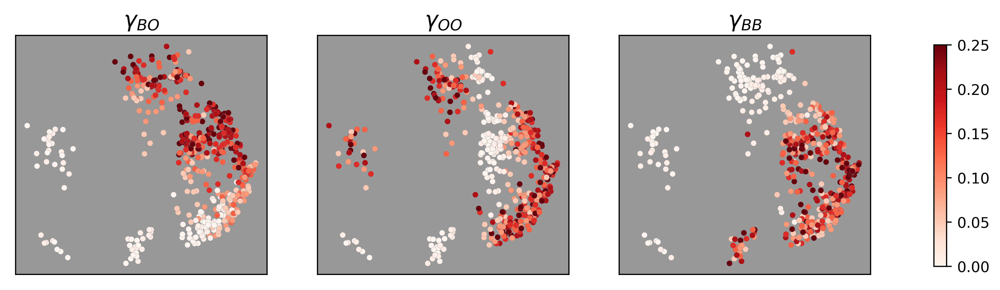

In [104]:
(H0_loss_vals, enc, dec, dl) = train_AE(0.001, n_epochs, vec_imgs_dim0, H0_grnd_truth, H0_plot_marker, 
                                     H0_hetero_adh, H0_homo_adh_OO, H0_homo_adh_BB, "TDA_H0_AE_model.chk")

(H0_AE_x, H0_AE_y, params_grnd, params_mark, 
 params_OB, params_OO, params_BB) = transform_AE("TDA_H0_AE_model.chk", enc, dec, dl)

plot_loss(n_epochs, H0_loss_vals, "AE Loss H0")

dim_reduction_plot(H0_AE_x, H0_AE_y, params_grnd, params_mark, 
                   params_OB, params_OO, params_BB, "AE")

Epoch (10/50) 	 Net Loss:3.093361328865285e-06
Epoch (20/50) 	 Net Loss:2.8686581572401337e-06
Epoch (30/50) 	 Net Loss:1.8793975868902635e-06
Epoch (40/50) 	 Net Loss:1.4973924180594622e-06
Epoch (50/50) 	 Net Loss:1.1990144912488176e-06


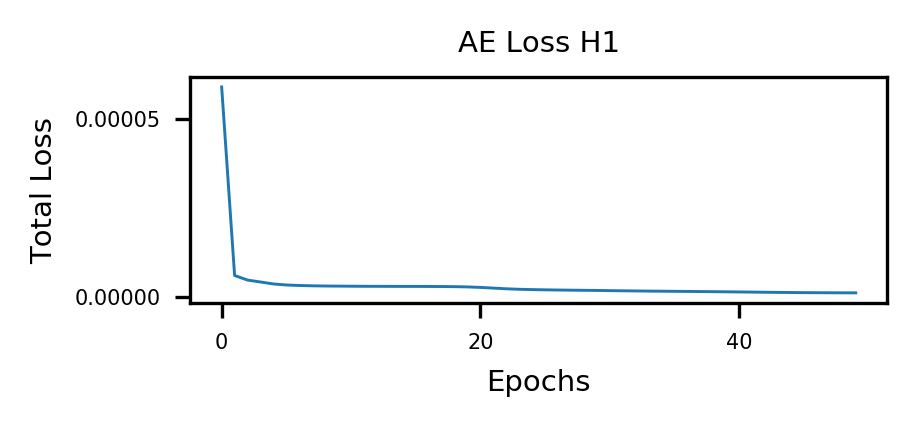

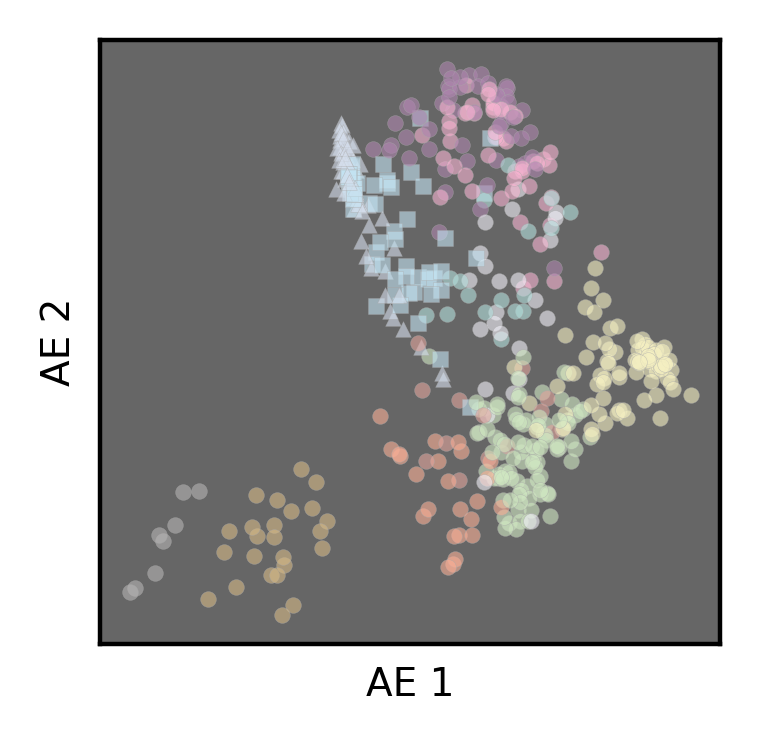

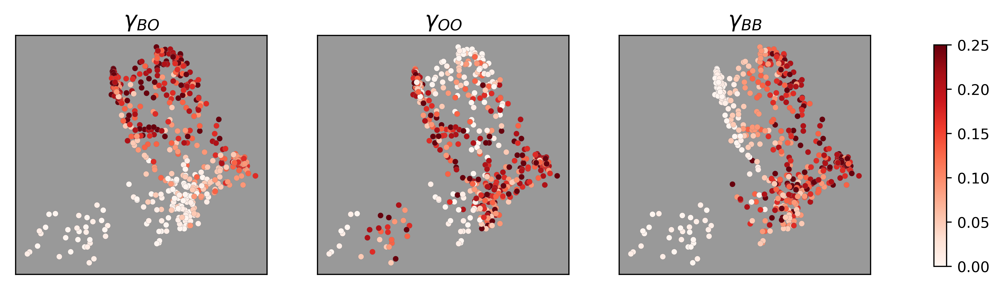

In [105]:
(H1_loss_vals, enc, dec, dl) = train_AE(0.001, n_epochs, vec_imgs_dim1, H1_grnd_truth, H1_plot_marker, 
                                        H1_hetero_adh, H1_homo_adh_OO, H1_homo_adh_BB, "TDA_H1_AE_model.chk")

(H1_AE_x, H1_AE_y, params_grnd, params_mark, 
 params_OB, params_OO, params_BB) = transform_AE("TDA_H1_AE_model.chk", enc, dec, dl)

plot_loss(n_epochs, H1_loss_vals, "AE Loss H1")

dim_reduction_plot(H1_AE_x, H1_AE_y, params_grnd, params_mark, 
                   params_OB, params_OO, params_BB, "AE")

Epoch (10/50) 	 Net Loss:8.575639185437467e-06
Epoch (20/50) 	 Net Loss:7.007016392890364e-06
Epoch (30/50) 	 Net Loss:3.190512416040292e-06
Epoch (40/50) 	 Net Loss:2.413546326351934e-06
Epoch (50/50) 	 Net Loss:2.0538454919005744e-06


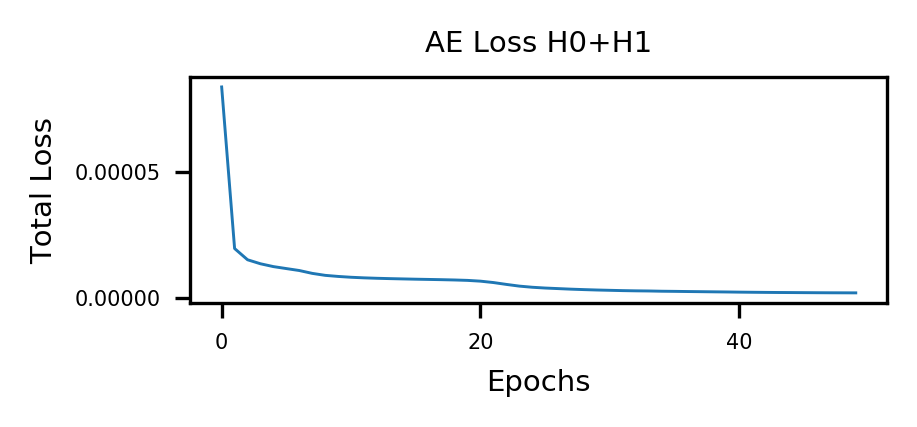

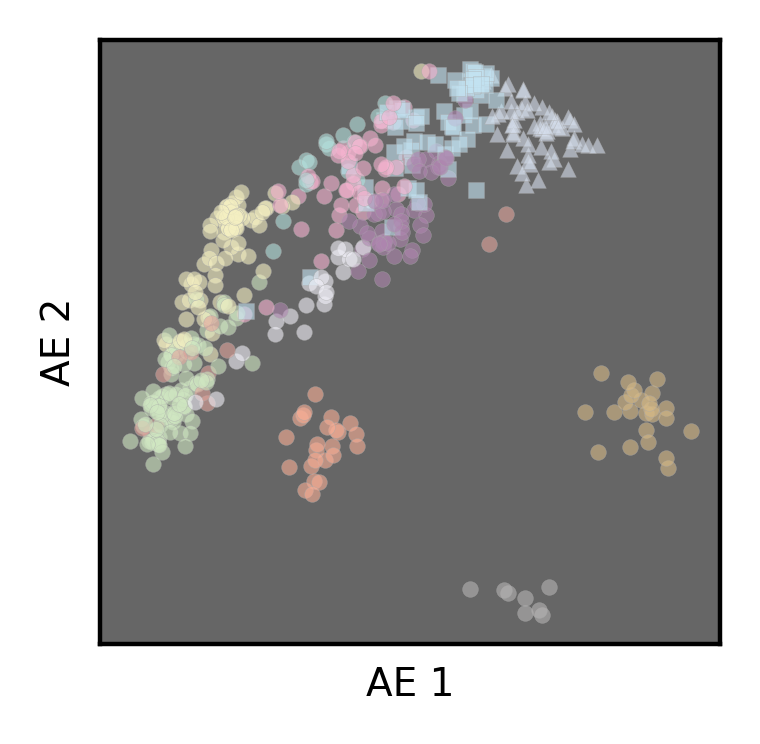

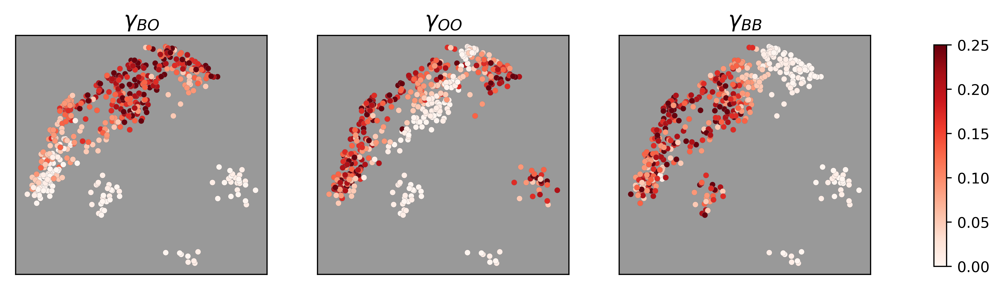

In [106]:
(H01_loss_vals, enc, dec, dl) = train_AE(0.001, n_epochs, vec_imgs, H0_grnd_truth, H0_plot_marker, 
                                        H0_hetero_adh, H0_homo_adh_OO, H0_homo_adh_BB, "TDA_H0p1_AE_model.chk")

(H01_AE_x, H01_AE_y, params_grnd, params_mark, 
 params_OB, params_OO, params_BB) = transform_AE("TDA_H0p1_AE_model.chk", enc, dec, dl)

plot_loss(n_epochs, H01_loss_vals, "AE Loss H0+H1")

dim_reduction_plot(H01_AE_x, H01_AE_y, params_grnd, params_mark, 
                   params_OB, params_OO, params_BB, "AE")

#### TODO

- Supervised and unsupervised classification
    - ROC curve, confusion matrix